# Introduction

This dataset provides a comprehensive overview of electric vehicle (EV) adoption trends across various U.S. states over multiple years. It includes key indicators such as the number of EV registrations, total vehicle count, and the percentage share of EVs. Additionally, the dataset incorporates information about charging infrastructure—like the number of stations, total charging outlets, and availability of DC fast chargers—which is crucial to supporting EV growth.

Beyond transportation data, the dataset also integrates socioeconomic factors such as labor force participation, unemployment rate, average fuel economy, and educational attainment levels. These dimensions offer valuable context to explore how demographics and infrastructure influence EV adoption patterns across states.

This multifaceted data can be used for descriptive analysis, policy evaluation, or predictive modeling to understand the enablers and barriers to EV transition in the U.S.

# Problem Statement

Electric vehicle (EV) adoption in the U.S. varies widely across states. This project aims to analyze how factors such as charging infrastructure, fuel economy, unemployment rate, education level, and political affiliation influence EV registrations. The goal is to identify key drivers of EV adoption and provide insights to support policy and investment decisions.



# Project Outcome

By analyzing this dataset,this project aims to:

- Visualized the relationship between EV Share (%) and Total Charging Outlets to understand how infrastructure availability impacts electric vehicle adoption.

- Built a correlation heatmap to explore relationships among features such as fuel economy, unemployment rate, education, and charging infrastructure.

- Analyzed the connection between EV Share (%) and Bachelor’s Degree Attainment, revealing the influence of education on EV adoption trends.

- Developed a Linear Regression model to predict EV Registrations, using features like total vehicles, charging stations, fuel economy, and socio-economic indicators.

- Built and compared classification models (Logistic Regression, Random Forest, Decision Tree) to predict the governing political party of each state.

# Description

###  Column Descriptions

| Column Name             | Description                                                |
|-------------------------|------------------------------------------------------------|
| EV Registrations        | Number of electric vehicles registered in a state         |
| state                   | Name of the U.S. state                                     |
| year                    | Year of the data record                                    |
| Total Vehicles          | Total number of registered vehicles (EV + non-EV)          |
| EV Share (%)            | Percentage of EVs compared to total vehicles               |
| Stations                | Number of EV charging stations                             |
| Total Charging Outlets  | Total number of EV charging outlets (ports)                |
| DC Fast                 | Number of DC fast charging outlets                         |
| fuel_economy            | Average fuel economy in the state                          |
| Unemployment_Rate       | Unemployment rate in the state                             |
| Bachelor_Attainment     | % of population with a bachelor’s degree                   |
| Party                   | Political party of the state government (e.g., Democrat)   |


In [2]:
import pandas as pd


In [3]:
df=pd.read_csv("Ev_Data.csv")


In [4]:
df.columns

Index(['Unnamed: 0', 'Unnamed: 0.1', 'EV Registrations', 'state', 'year',
       'Total Vehicles', 'EV Share (%)', 'Stations', 'Total Charging Outlets',
       'DC Fast', 'fuel_economy', 'Unemployment_Rate', 'Bachelor_Attainment',
       'Party'],
      dtype='object')

In [5]:
df.head()

,Unnamed: 0,Unnamed: 0.1,EV Registrations,state,year,Total Vehicles,EV Share (%),Stations,Total Charging Outlets,DC Fast,fuel_economy,Unemployment_Rate,Bachelor_Attainment,Party
0,0,0,13000.0,Alabama,2023,4835900,0.27,424,1096,357,26.302158,3.5,NaN,Republican
1,1,1,2700.0,Alaska,2023,559800,0.48,65,124,34,26.302158,4.5,28.79,Republican
2,2,2,89800.0,Arizona,2023,6529000,1.38,1198,3506,1019,26.302158,3.8,30.03,Democratic
3,3,3,7100.0,Arkansas,2023,2708300,0.26,334,833,121,26.302158,3.9,24.22,Republican
4,4,4,1256600.0,California,2023,36850300,3.41,16381,49433,10548,26.302158,5.2,34.43,Democratic


In [6]:
df.tail()

,Unnamed: 0,Unnamed: 0.1,EV Registrations,state,year,Total Vehicles,EV Share (%),Stations,Total Charging Outlets,DC Fast,fuel_economy,Unemployment_Rate,Bachelor_Attainment,Party
408,70,70,NaN,Maine,2022,1222000,0.41,412,869,179,28.468750,3.0,32.78,Democratic
409,218,218,NaN,Indiana,2019,5972800,0.09,239,614,137,32.957895,3.8,25.16,Republican
410,258,258,NaN,Arkansas,2018,2591500,0.02,70,124,20,54.000000,4.0,21.22,Republican
411,33,33,NaN,North Carolina,2023,9085500,0.77,1595,4204,979,26.302158,3.7,34.24,Republican
412,42,42,NaN,Tennessee,2023,6538800,0.51,918,2225,479,26.302158,3.7,NaN,Republican


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 413 entries, 0 to 412
Data columns (total 14 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Unnamed: 0              413 non-null    int64  
 1   Unnamed: 0.1            413 non-null    int64  
 2   EV Registrations        388 non-null    float64
 3   state                   413 non-null    object 
 4   year                    413 non-null    int64  
 5   Total Vehicles          413 non-null    int64  
 6   EV Share (%)            413 non-null    float64
 7   Stations                413 non-null    int64  
 8   Total Charging Outlets  413 non-null    int64  
 9   DC Fast                 413 non-null    int64  
 10  fuel_economy            294 non-null    float64
 11  Unemployment_Rate       393 non-null    float64
 12  Bachelor_Attainment     392 non-null    float64
 13  Party                   305 non-null    object 
dtypes: float64(5), int64(7), object(2)
memory 

In [8]:
df.shape

(413, 14)

In [9]:
df.isnull().sum()

Unnamed: 0                  0
Unnamed: 0.1                0
EV Registrations           25
state                       0
year                        0
Total Vehicles              0
EV Share (%)                0
Stations                    0
Total Charging Outlets      0
DC Fast                     0
fuel_economy              119
Unemployment_Rate          20
Bachelor_Attainment        21
Party                     108
dtype: int64

In [10]:
for col in ['EV Registrations', 'fuel_economy', 'Unemployment_Rate', 'Bachelor_Attainment']:
    df[col].fillna(df[col].mean(), inplace=True)

df['Party'].fillna(df['Party'].mode()[0], inplace=True)



C:\Users\kunal\AppData\Local\Temp\ipykernel_37480\2095837826.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(df[col].mean(), inplace=True)
C:\Users\kunal\AppData\Local\Temp\ipykernel_37480\2095837826.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

In [11]:
df

,Unnamed: 0,Unnamed: 0.1,EV Registrations,state,year,Total Vehicles,EV Share (%),Stations,Total Charging Outlets,DC Fast,fuel_economy,Unemployment_Rate,Bachelor_Attainment,Party
0,0,0,1.300000e+04,Alabama,2023,4835900,0.27,424,1096,357,26.302158,3.5,30.658367,Republican
1,1,1,2.700000e+03,Alaska,2023,559800,0.48,65,124,34,26.302158,4.5,28.790000,Republican
2,2,2,8.980000e+04,Arizona,2023,6529000,1.38,1198,3506,1019,26.302158,3.8,30.030000,Democratic
3,3,3,7.100000e+03,Arkansas,2023,2708300,0.26,334,833,121,26.302158,3.9,24.220000,Republican
4,4,4,1.256600e+06,California,2023,36850300,3.41,16381,49433,10548,26.302158,5.2,34.430000,Democratic
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
408,70,70,2.577680e+04,Maine,2022,1222000,0.41,412,869,179,28.468750,3.0,32.780000,Democratic
409,218,218,2.577680e+04,Indiana,2019,5972800,0.09,239,614,137,32.957895,3.8,25.160000,Republican
410,258,258,2.577680e+04,Arkansas,2018,2591500,0.02,70,124,20,54.000000,4.0,21.220000,Republican
411,33,33,2.577680e+04,North Carolina,2023,9085500,0.77,1595,4204,979,26.302158,3.7,34.240000,Republican


In [12]:
df.isnull().sum()

Unnamed: 0                0
Unnamed: 0.1              0
EV Registrations          0
state                     0
year                      0
Total Vehicles            0
EV Share (%)              0
Stations                  0
Total Charging Outlets    0
DC Fast                   0
fuel_economy              0
Unemployment_Rate         0
Bachelor_Attainment       0
Party                     0
dtype: int64

In [13]:
df['Party'].value_counts()

Party
Republican    266
Democratic    147
Name: count, dtype: int64

In [14]:
df.sort_values(by='state')


,Unnamed: 0,Unnamed: 0.1,EV Registrations,state,year,Total Vehicles,EV Share (%),Stations,Total Charging Outlets,DC Fast,fuel_economy,Unemployment_Rate,Bachelor_Attainment,Party
0,0,0,13000.0,Alabama,2023,4835900,0.27,424,1096,357,26.302158,3.50000,30.658367,Republican
102,102,102,4700.0,Alabama,2021,4747600,0.10,277,682,118,28.519774,5.10000,25.320000,Republican
153,153,153,2900.0,Alabama,2020,4683200,0.06,224,598,91,30.634146,4.90000,24.835000,Republican
204,204,204,2000.0,Alabama,2019,4593200,0.04,195,506,65,32.957895,4.70000,24.350000,Republican
306,306,306,800.0,Alabama,2017,4458900,0.02,145,319,51,33.284317,5.40000,23.550000,Republican
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
152,152,152,500.0,Wyoming,2021,643300,0.08,70,184,77,28.519774,3.20000,26.200000,Republican
407,407,407,100.0,Wyoming,2016,615100,0.02,32,63,24,33.284317,5.10000,24.200000,Republican
101,101,101,800.0,Wyoming,2022,644400,0.12,86,214,94,28.468750,4.45458,27.230000,Republican
254,254,254,200.0,Wyoming,2019,630800,0.03,57,159,65,32.957895,3.10000,25.160000,Republican


In [15]:
df.describe(include='all')

,Unnamed: 0,Unnamed: 0.1,EV Registrations,state,year,Total Vehicles,EV Share (%),Stations,Total Charging Outlets,DC Fast,fuel_economy,Unemployment_Rate,Bachelor_Attainment,Party
count,413.000000,413.000000,4.130000e+02,413,413.000000,4.130000e+02,413.000000,413.000000,413.000000,413.000000,413.000000,413.000000,413.000000,413
unique,NaN,NaN,NaN,51,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
top,NaN,NaN,NaN,Arkansas,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Republican
freq,NaN,NaN,NaN,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,266
mean,202.539952,202.539952,2.577680e+04,NaN,2019.518160,5.411485e+06,0.329298,703.389831,1962.198547,337.329298,33.284317,4.454580,30.658367,NaN
std,117.987952,117.987952,8.897444e+04,NaN,2.297695,5.953865e+06,0.446364,1500.211194,4720.070850,852.791882,7.833271,1.203012,6.241744,NaN
min,0.000000,0.000000,0.000000e+00,NaN,2016.000000,3.121000e+05,0.000000,3.000000,5.000000,0.000000,26.302158,1.900000,19.100000,NaN
25%,100.000000,100.000000,1.600000e+03,NaN,2018.000000,1.524400e+06,0.060000,126.000000,315.000000,62.000000,28.519774,3.600000,26.780000,NaN
50%,203.000000,203.000000,6.400000e+03,NaN,2020.000000,3.973600e+06,0.170000,328.000000,839.000000,129.000000,32.957895,4.400000,30.280000,NaN
75%,304.000000,304.000000,2.430000e+04,NaN,2022.000000,6.545500e+06,0.410000,738.000000,1903.000000,332.000000,33.284317,5.200000,33.400000,NaN


In [16]:
df.iloc[:5]

,Unnamed: 0,Unnamed: 0.1,EV Registrations,state,year,Total Vehicles,EV Share (%),Stations,Total Charging Outlets,DC Fast,fuel_economy,Unemployment_Rate,Bachelor_Attainment,Party
0,0,0,13000.0,Alabama,2023,4835900,0.27,424,1096,357,26.302158,3.5,30.658367,Republican
1,1,1,2700.0,Alaska,2023,559800,0.48,65,124,34,26.302158,4.5,28.790000,Republican
2,2,2,89800.0,Arizona,2023,6529000,1.38,1198,3506,1019,26.302158,3.8,30.030000,Democratic
3,3,3,7100.0,Arkansas,2023,2708300,0.26,334,833,121,26.302158,3.9,24.220000,Republican
4,4,4,1256600.0,California,2023,36850300,3.41,16381,49433,10548,26.302158,5.2,34.430000,Democratic


In [17]:
df.iloc[2][["state","year","EV Registrations" ]]

state               Arizona
year                   2023
EV Registrations    89800.0
Name: 2, dtype: object

In [18]:
df

,Unnamed: 0,Unnamed: 0.1,EV Registrations,state,year,Total Vehicles,EV Share (%),Stations,Total Charging Outlets,DC Fast,fuel_economy,Unemployment_Rate,Bachelor_Attainment,Party
0,0,0,1.300000e+04,Alabama,2023,4835900,0.27,424,1096,357,26.302158,3.5,30.658367,Republican
1,1,1,2.700000e+03,Alaska,2023,559800,0.48,65,124,34,26.302158,4.5,28.790000,Republican
2,2,2,8.980000e+04,Arizona,2023,6529000,1.38,1198,3506,1019,26.302158,3.8,30.030000,Democratic
3,3,3,7.100000e+03,Arkansas,2023,2708300,0.26,334,833,121,26.302158,3.9,24.220000,Republican
4,4,4,1.256600e+06,California,2023,36850300,3.41,16381,49433,10548,26.302158,5.2,34.430000,Democratic
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
408,70,70,2.577680e+04,Maine,2022,1222000,0.41,412,869,179,28.468750,3.0,32.780000,Democratic
409,218,218,2.577680e+04,Indiana,2019,5972800,0.09,239,614,137,32.957895,3.8,25.160000,Republican
410,258,258,2.577680e+04,Arkansas,2018,2591500,0.02,70,124,20,54.000000,4.0,21.220000,Republican
411,33,33,2.577680e+04,North Carolina,2023,9085500,0.77,1595,4204,979,26.302158,3.7,34.240000,Republican


In [19]:
df['state'].unique()

array(['Alabama', 'Alaska', 'Arizona', 'Arkansas', 'California',
       'Colorado', 'Connecticut', 'Delaware', 'District Of Columbia',
       'Florida', 'Georgia', 'Hawaii', 'Idaho', 'Illinois', 'Indiana',
       'Iowa', 'Kansas', 'Kentucky', 'Louisiana', 'Maine', 'Maryland',
       'Massachusetts', 'Michigan', 'Minnesota', 'Mississippi',
       'Missouri', 'Montana', 'Nebraska', 'Nevada', 'New Hampshire',
       'New Jersey', 'New Mexico', 'New York', 'North Carolina',
       'North Dakota', 'Ohio', 'Oklahoma', 'Oregon', 'Pennsylvania',
       'Rhode Island', 'South Carolina', 'South Dakota', 'Tennessee',
       'Texas', 'Utah', 'Vermont', 'Virginia', 'Washington',
       'West Virginia', 'Wisconsin', 'Wyoming'], dtype=object)

In [20]:
df.duplicated().sum()

5

In [21]:
df.drop_duplicates()

,Unnamed: 0,Unnamed: 0.1,EV Registrations,state,year,Total Vehicles,EV Share (%),Stations,Total Charging Outlets,DC Fast,fuel_economy,Unemployment_Rate,Bachelor_Attainment,Party
0,0,0,13000.0,Alabama,2023,4835900,0.27,424,1096,357,26.302158,3.5,30.658367,Republican
1,1,1,2700.0,Alaska,2023,559800,0.48,65,124,34,26.302158,4.5,28.790000,Republican
2,2,2,89800.0,Arizona,2023,6529000,1.38,1198,3506,1019,26.302158,3.8,30.030000,Democratic
3,3,3,7100.0,Arkansas,2023,2708300,0.26,334,833,121,26.302158,3.9,24.220000,Republican
4,4,4,1256600.0,California,2023,36850300,3.41,16381,49433,10548,26.302158,5.2,34.430000,Democratic
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
403,403,403,3100.0,Virginia,2016,7403200,0.04,427,991,132,33.284317,4.6,35.400000,Republican
404,404,404,14900.0,Washington,2016,6228400,0.24,738,1791,129,33.284317,5.0,31.950000,Republican
405,405,405,100.0,West Virginia,2016,1524400,0.01,43,96,5,33.284317,7.2,19.820000,Republican
406,406,406,2600.0,Wisconsin,2016,5368300,0.05,280,445,50,33.284317,3.8,27.500000,Republican


In [22]:
df_cleaned = df.drop(columns=['Unnamed: 0.1', 'Unnamed: 0'], errors='ignore')


In [23]:
df_cleaned.corr(numeric_only=True)

,EV Registrations,year,Total Vehicles,EV Share (%),Stations,Total Charging Outlets,DC Fast,fuel_economy,Unemployment_Rate,Bachelor_Attainment
EV Registrations,1.000000,0.201830,0.662977,0.601431,0.942020,0.938296,0.973931,-0.098757,0.098472,0.112739
year,0.201830,1.000000,0.026151,0.565684,0.207390,0.180881,0.244512,-0.502468,-0.242787,0.247865
Total Vehicles,0.662977,0.026151,1.000000,0.295716,0.767339,0.773230,0.709426,0.006343,0.192001,0.048679
EV Share (%),0.601431,0.565684,0.295716,1.000000,0.588468,0.566477,0.598752,-0.313301,-0.021708,0.468089
Stations,0.942020,0.207390,0.767339,0.588468,1.000000,0.984826,0.968174,-0.101606,0.145320,0.176336
Total Charging Outlets,0.938296,0.180881,0.773230,0.566477,0.984826,1.000000,0.968797,-0.086439,0.146897,0.157720
DC Fast,0.973931,0.244512,0.709426,0.598752,0.968174,0.968797,1.000000,-0.120910,0.109850,0.128690
fuel_economy,-0.098757,-0.502468,0.006343,-0.313301,-0.101606,-0.086439,-0.120910,1.000000,0.045498,-0.143080
Unemployment_Rate,0.098472,-0.242787,0.192001,-0.021708,0.145320,0.146897,0.109850,0.045498,1.000000,-0.049005
Bachelor_Attainment,0.112739,0.247865,0.048679,0.468089,0.176336,0.157720,0.128690,-0.143080,-0.049005,1.000000


In [24]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Line Plot

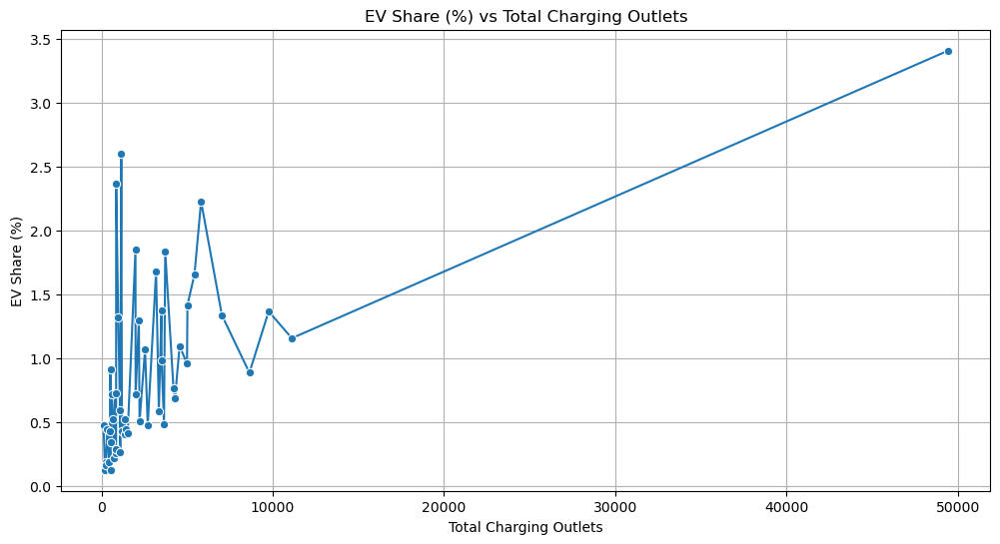

In [25]:
# filter for the latest year
latest_year = df_cleaned['year'].max()
latest_data = df_cleaned[df_cleaned['year'] == latest_year]

sorted_data = latest_data.sort_values(by='Total Charging Outlets')

plt.figure(figsize=(12, 6))
sns.lineplot(data=sorted_data, x='Total Charging Outlets', y='EV Share (%)', marker='o')

plt.title('EV Share (%) vs Total Charging Outlets')
plt.xlabel('Total Charging Outlets')
plt.ylabel('EV Share (%)')
plt.grid(True)

plt.show()

- The graph shows that EV share (%) does not consistently increase with the number of total charging outlets, suggesting other factors may influence EV adoption.

# SubPlot

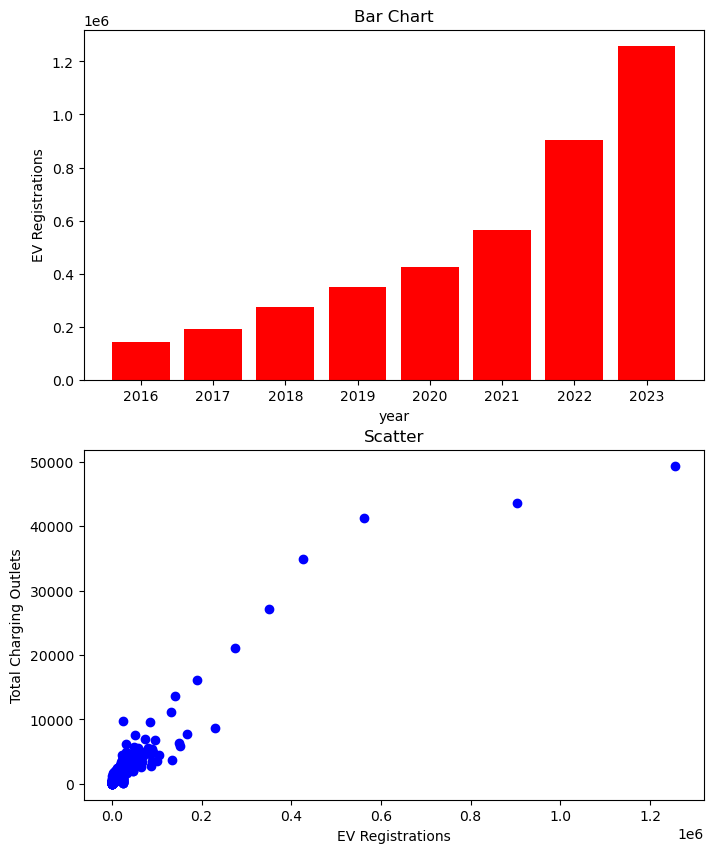

In [26]:
x=df_cleaned['year']
y=df_cleaned['EV Registrations']
plt.figure(figsize=(8, 10))
plt.subplot(2,1,1)
plt.title("Bar Chart")
plt.xlabel('year')
plt.ylabel('EV Registrations')
plt.bar(x,y,color='red')

z=df_cleaned['Total Charging Outlets']
plt.subplot(2,1,2)
plt.title("Scatter")
plt.xlabel("EV Registrations")
plt.ylabel("Total Charging Outlets")
plt.scatter(y,z,color='blue')

# Scatter Plot

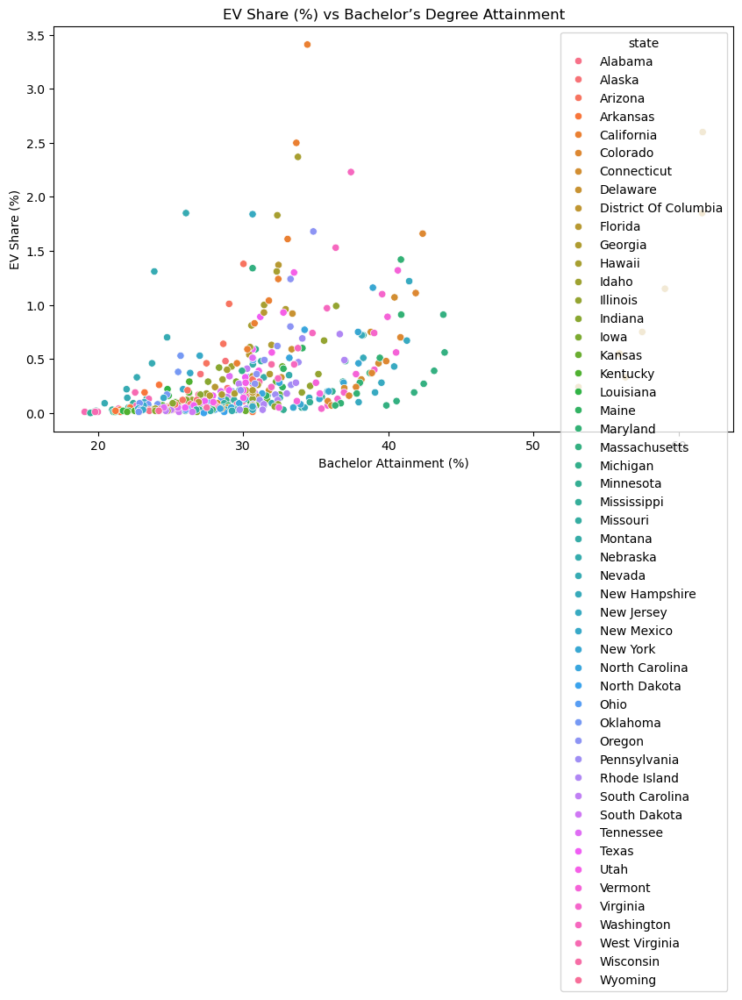

In [27]:
plt.figure(figsize=(10, 6))

sns.scatterplot(data=df_cleaned, x='Bachelor_Attainment', y='EV Share (%)', hue='state')
plt.title('EV Share (%) vs Bachelor’s Degree Attainment')
plt.xlabel('Bachelor Attainment (%)')
plt.ylabel('EV Share (%)')
plt.show()


- The scatter plot suggests a positive correlation between bachelor's degree attainment and EV share (%), indicating that regions with higher education levels tend to have greater EV adoption


# Pie Chart

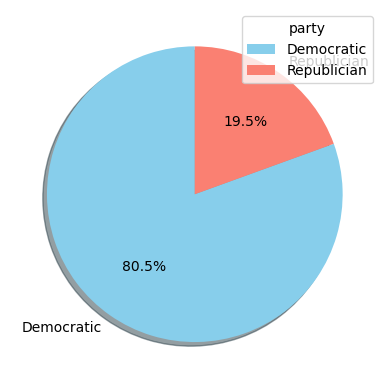

In [28]:
latest_year=df_cleaned['year'].max()
party_data = df_cleaned[df_cleaned['year'] == latest_year].groupby('Party')['EV Registrations'].sum()
label=['Democratic','Republician']
plt.pie(party_data,labels=label,autopct='%1.1f%%',startangle=90,colors=['skyblue','salmon'],shadow=True)
plt.legend(title='party')
plt.show()

- The pie chart shows that Democratic states account for the majority (80.5%) of EV registrations, indicating a strong political influence on EV adoption.

# Displot

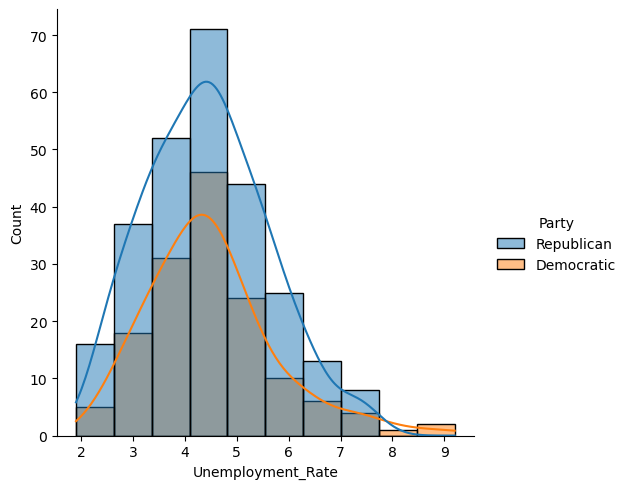

In [29]:
sns.displot(df_cleaned,x='Unemployment_Rate',kde=True,hue='Party',bins=10)
plt.show()

- The distribution plot shows that Republican states generally have higher unemployment rates, while Democratic states are more concentrated around lower unemployment levels.

# Histplot

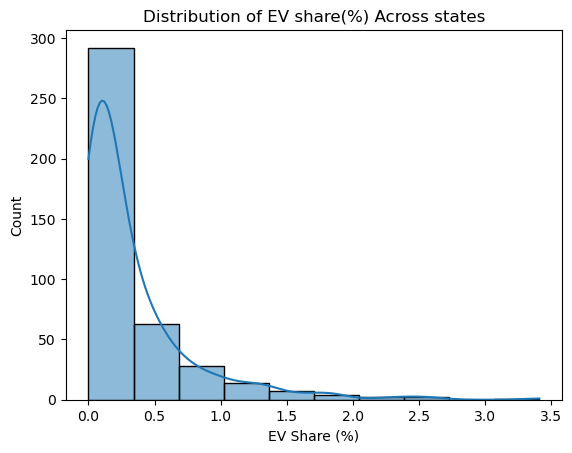

In [30]:
sns.histplot(data=df_cleaned,x='EV Share (%)',kde=True,bins=10)
plt.title("Distribution of EV share(%) Across states")
plt.show()

print()

- The histogram shows that most states have a very low EV Share (%), clustered below 0.5%, with only a few states reaching above 1%. This indicates that EV adoption is still limited and unevenly distributed across states.

# Countplot

C:\Users\kunal\AppData\Local\Temp\ipykernel_37480\59654158.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(df_cleaned,x='Party',palette='Set2')


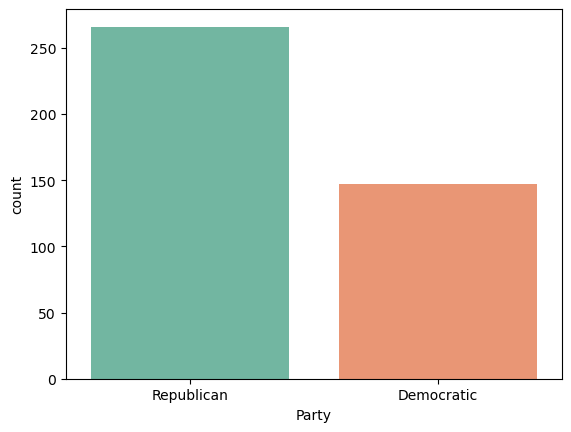

Conclusion: More records belong to Republican states than Democratic states


In [31]:
sns.countplot(df_cleaned,x='Party',palette='Set2')
plt.show()

print("Conclusion: More records belong to Republican states than Democratic states")

# BoxPlot

C:\Users\kunal\AppData\Local\Temp\ipykernel_37480\4165940086.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Party',y='EV Share (%)',data=df_cleaned,palette='Set3')


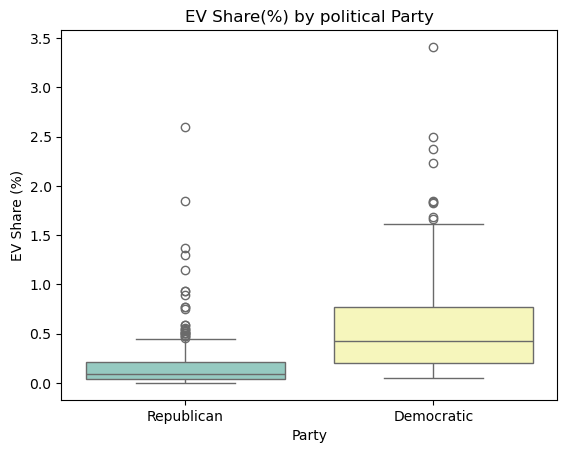

In [32]:
sns.boxplot(x='Party',y='EV Share (%)',data=df_cleaned,palette='Set3')
plt.title("EV Share(%) by political Party")
plt.show()




- Democaratic States have genearlly higher Ev adoption rate than Republician

# Heatmap

Text(0.5, 1.0, 'Correlation  Heatmap of Ev DataSet')

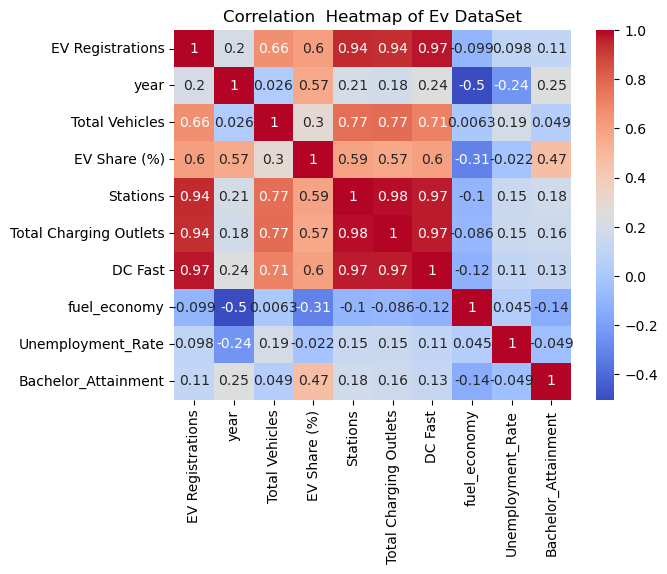

In [33]:
corr=df_cleaned.corr(numeric_only=True)
sns.heatmap(corr,annot=True,cmap='coolwarm')
plt.title("Correlation  Heatmap of Ev DataSet")

In [34]:
pip install ydata-profiling

Note: you may need to restart the kernel to use updated packages.


In [35]:
from ydata_profiling import ProfileReport

In [36]:
df_ev = pd.read_csv("Ev_Data.csv")


In [37]:
report = ProfileReport(df_ev, title="My Data Report",explorative=True)

In [38]:
report.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 14/14 [00:00<00:00, 1111.62it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Outliers

In [39]:
df_cleaned.shape

(413, 12)

In [40]:
import pandas as pd


numeric_cols = df_cleaned.select_dtypes(include=['int64', 'float64']).columns
print(numeric_cols)


Index(['EV Registrations', 'year', 'Total Vehicles', 'EV Share (%)',
       'Stations', 'Total Charging Outlets', 'DC Fast', 'fuel_economy',
       'Unemployment_Rate', 'Bachelor_Attainment'],
      dtype='object')


In [41]:
for col in numeric_cols:
    Q1 = df_cleaned[col].quantile(0.25)
    Q3 = df_cleaned[col].quantile(0.75)
    IQR = Q3 - Q1
    df_iqr = df_cleaned[(df[col] >= Q1 - 1.5 * IQR) & (df_cleaned[col] <= Q3 + 1.5 * IQR)]


In [42]:
# After outlier removal
df_iqr.shape


(404, 12)

# Encoding

In [43]:
pip install scikit-learn

Note: you may need to restart the kernel to use updated packages.


In [44]:
df_iqr.head()

,EV Registrations,state,year,Total Vehicles,EV Share (%),Stations,Total Charging Outlets,DC Fast,fuel_economy,Unemployment_Rate,Bachelor_Attainment,Party
0,13000.0,Alabama,2023,4835900,0.27,424,1096,357,26.302158,3.5,30.658367,Republican
1,2700.0,Alaska,2023,559800,0.48,65,124,34,26.302158,4.5,28.790000,Republican
2,89800.0,Arizona,2023,6529000,1.38,1198,3506,1019,26.302158,3.8,30.030000,Democratic
3,7100.0,Arkansas,2023,2708300,0.26,334,833,121,26.302158,3.9,24.220000,Republican
4,1256600.0,California,2023,36850300,3.41,16381,49433,10548,26.302158,5.2,34.430000,Democratic


In [45]:
df_iqr['Party'].unique()

array(['Republican', 'Democratic'], dtype=object)

In [46]:
from sklearn.preprocessing import LabelEncoder

label=LabelEncoder()
df_iqr['Party']=label.fit_transform(df_iqr['Party'])

C:\Users\kunal\AppData\Local\Temp\ipykernel_37480\1206651352.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_iqr['Party']=label.fit_transform(df_iqr['Party'])


In [47]:
df_iqr['Party'].dtypes

dtype('int32')

In [48]:
df_iqr

,EV Registrations,state,year,Total Vehicles,EV Share (%),Stations,Total Charging Outlets,DC Fast,fuel_economy,Unemployment_Rate,Bachelor_Attainment,Party
0,1.300000e+04,Alabama,2023,4835900,0.27,424,1096,357,26.302158,3.5,30.658367,1
1,2.700000e+03,Alaska,2023,559800,0.48,65,124,34,26.302158,4.5,28.790000,1
2,8.980000e+04,Arizona,2023,6529000,1.38,1198,3506,1019,26.302158,3.8,30.030000,0
3,7.100000e+03,Arkansas,2023,2708300,0.26,334,833,121,26.302158,3.9,24.220000,1
4,1.256600e+06,California,2023,36850300,3.41,16381,49433,10548,26.302158,5.2,34.430000,0
...,...,...,...,...,...,...,...,...,...,...,...,...
408,2.577680e+04,Maine,2022,1222000,0.41,412,869,179,28.468750,3.0,32.780000,0
409,2.577680e+04,Indiana,2019,5972800,0.09,239,614,137,32.957895,3.8,25.160000,1
410,2.577680e+04,Arkansas,2018,2591500,0.02,70,124,20,54.000000,4.0,21.220000,1
411,2.577680e+04,North Carolina,2023,9085500,0.77,1595,4204,979,26.302158,3.7,34.240000,1


# feature Construction

In [49]:
#Ev Share Ratio(The proption of Ev vehicles among all vehicles)

df_iqr['ev_share_ratio']=df_iqr['EV Share (%)']/100

# How many years have passed since 2019

df_iqr['year_since_2019']=df_iqr['year']-2019

C:\Users\kunal\AppData\Local\Temp\ipykernel_37480\72743855.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_iqr['ev_share_ratio']=df_iqr['EV Share (%)']/100
C:\Users\kunal\AppData\Local\Temp\ipykernel_37480\72743855.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_iqr['year_since_2019']=df_iqr['year']-2019


In [50]:
df_iqr

,EV Registrations,state,year,Total Vehicles,EV Share (%),Stations,Total Charging Outlets,DC Fast,fuel_economy,Unemployment_Rate,Bachelor_Attainment,Party,ev_share_ratio,year_since_2019
0,1.300000e+04,Alabama,2023,4835900,0.27,424,1096,357,26.302158,3.5,30.658367,1,0.0027,4
1,2.700000e+03,Alaska,2023,559800,0.48,65,124,34,26.302158,4.5,28.790000,1,0.0048,4
2,8.980000e+04,Arizona,2023,6529000,1.38,1198,3506,1019,26.302158,3.8,30.030000,0,0.0138,4
3,7.100000e+03,Arkansas,2023,2708300,0.26,334,833,121,26.302158,3.9,24.220000,1,0.0026,4
4,1.256600e+06,California,2023,36850300,3.41,16381,49433,10548,26.302158,5.2,34.430000,0,0.0341,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
408,2.577680e+04,Maine,2022,1222000,0.41,412,869,179,28.468750,3.0,32.780000,0,0.0041,3
409,2.577680e+04,Indiana,2019,5972800,0.09,239,614,137,32.957895,3.8,25.160000,1,0.0009,0
410,2.577680e+04,Arkansas,2018,2591500,0.02,70,124,20,54.000000,4.0,21.220000,1,0.0002,-1
411,2.577680e+04,North Carolina,2023,9085500,0.77,1595,4204,979,26.302158,3.7,34.240000,1,0.0077,4


# Linear Regression

In [51]:

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error,r2_score

In [52]:
# to predict the Ev Registrations out of total vehicles

#feature and target selection

X = df_iqr[['year', 'Total Vehicles', 'Stations',
        'Total Charging Outlets', 'DC Fast', 'fuel_economy',
        'Unemployment_Rate', 'Bachelor_Attainment',
        'Party', 'year_since_2019']]
y = df_iqr['EV Registrations']  # New target



In [53]:
x.shape

(413,)

In [54]:
y.shape

(404,)

# With Scaling

In [55]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [56]:
x_train,x_test,y_train,y_test=train_test_split(X_scaled,y,test_size=0.2,random_state=42)

In [57]:
model = LinearRegression()
model.fit(x_train, y_train)

LinearRegression()

In [58]:
y_pred=model.predict(x_test)

In [59]:
r2_test_scale=r2_score(y_test,y_pred)
print("R2 score:",r2_test_scale)

R2 score: 0.9171166913738917


# Logistic Regression

In [60]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression 
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

#  Features (X) and Target (y)
X = df_iqr[['EV Registrations', 'year', 'Total Vehicles', 'Stations',
        'Total Charging Outlets', 'DC Fast', 'fuel_economy',
        'Unemployment_Rate', 'Bachelor_Attainment',
        'year_since_2019']]  # No 'Party' in features


y=df_iqr['Party']
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

#  Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

#  Train model
model = LogisticRegression()
model.fit(X_train, y_train)

#  Predictions
y_pred = model.predict(X_test)

#  Evaluation
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))
print("\nAccuracy Score:", accuracy_score(y_test, y_pred))


Confusion Matrix:
 [[22  7]
 [ 4 48]]

Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.76      0.80        29
           1       0.87      0.92      0.90        52

    accuracy                           0.86        81
   macro avg       0.86      0.84      0.85        81
weighted avg       0.86      0.86      0.86        81


Accuracy Score: 0.8641975308641975


# Decision Tree

In [61]:
from sklearn.tree import DecisionTreeClassifier

In [62]:
X = df_iqr[['EV Registrations', 'year', 'Total Vehicles', 'Stations',
        'Total Charging Outlets', 'DC Fast', 'fuel_economy',
        'Unemployment_Rate', 'Bachelor_Attainment',
        'year_since_2019']] # features
y=df_iqr['Party'] # Target

In [63]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [64]:
clf = DecisionTreeClassifier(random_state=42)
clf.fit(X_train, y_train)

DecisionTreeClassifier(random_state=42)

In [65]:
y_pred = clf.predict(X_test)

In [66]:
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))
print("\nAccuracy Score:", accuracy_score(y_test, y_pred))

Confusion Matrix:
 [[23  6]
 [ 6 46]]

Classification Report:
               precision    recall  f1-score   support

           0       0.79      0.79      0.79        29
           1       0.88      0.88      0.88        52

    accuracy                           0.85        81
   macro avg       0.84      0.84      0.84        81
weighted avg       0.85      0.85      0.85        81


Accuracy Score: 0.8518518518518519


# Plotting a decision tree

In [67]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

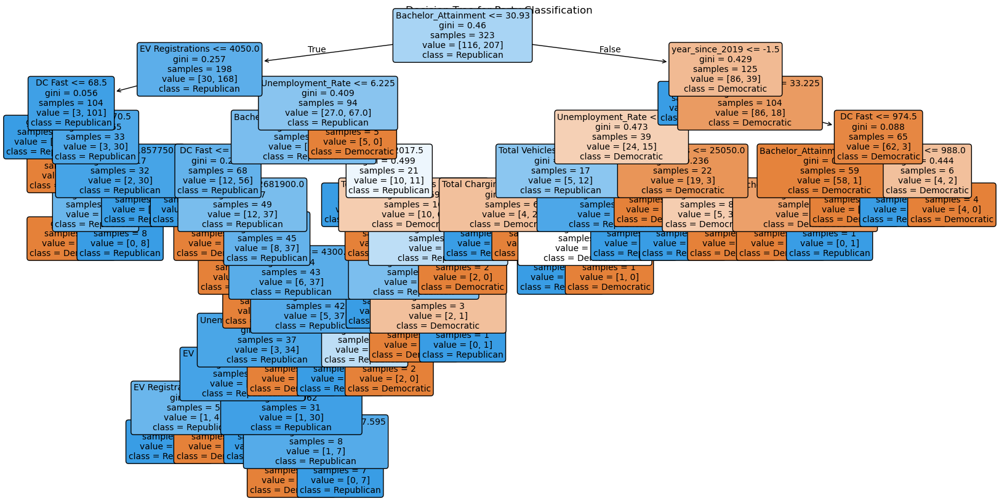

In [68]:
plt.figure(figsize=(20, 10)) 
plot_tree(clf,
         feature_names=X.columns,
         class_names=['Democratic','Republican'],
         filled=True,
         rounded=True,
         fontsize=10)
plt.title('Decision Tree for Party Classification')
plt.show()

# Random Forest

In [69]:
from sklearn.ensemble import RandomForestClassifier

In [70]:
X = df_iqr[['EV Registrations', 'year', 'Total Vehicles', 'Stations',
        'Total Charging Outlets', 'DC Fast', 'fuel_economy',
        'Unemployment_Rate', 'Bachelor_Attainment',
        'year_since_2019']] # features
y=df_iqr['Party'] # Target

In [71]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [72]:
rf_model=RandomForestClassifier(n_estimators=100,random_state=42)

In [73]:
rf_model.fit(X_train,y_train)

RandomForestClassifier(random_state=42)

In [74]:
y_pred=rf_model.predict(X_test)

In [75]:
y_pred

array([1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0,
       0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0,
       1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0,
       1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1])

In [76]:
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))
print("\nAccuracy Score:", accuracy_score(y_test, y_pred))

Confusion Matrix:
 [[22  7]
 [ 4 48]]

Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.76      0.80        29
           1       0.87      0.92      0.90        52

    accuracy                           0.86        81
   macro avg       0.86      0.84      0.85        81
weighted avg       0.86      0.86      0.86        81


Accuracy Score: 0.8641975308641975


In [77]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'n_estimators': [100, 150],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5]
}

grid_search = GridSearchCV(RandomForestClassifier(random_state=42), param_grid, cv=5)
grid_search.fit(X_train, y_train)

print("Best parameters:", grid_search.best_params_)
print("Best CV Score:", grid_search.best_score_)

# Retrain best model
best_rf = grid_search.best_estimator_


Best parameters: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 100}
Best CV Score: 0.8853846153846152


# Plotting a Tree

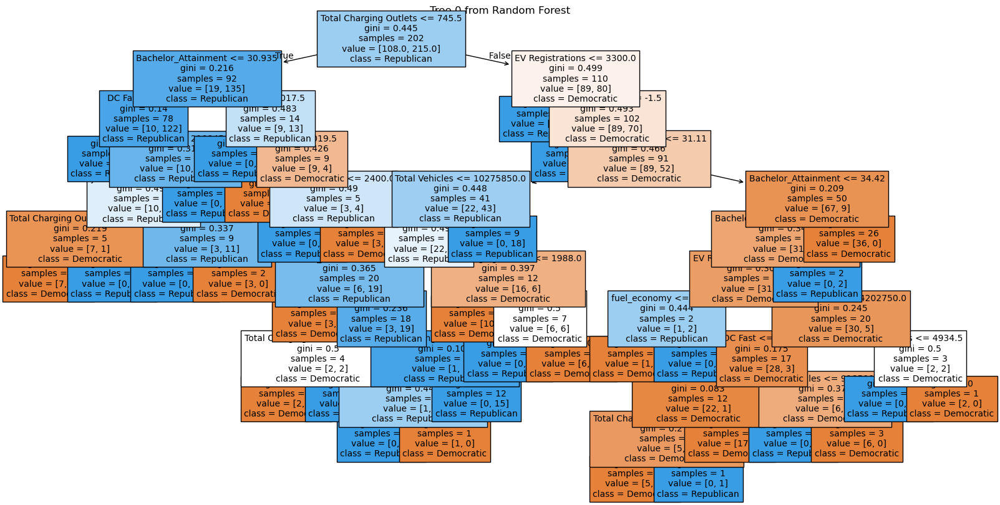

In [78]:
plt.figure(figsize=(20, 10))
estimator = rf_model.estimators_[0] 
plot_tree(estimator,
         feature_names=X.columns,
         class_names=['Democratic','Republican'],
         filled=True,
         fontsize=10)
plt.title("Tree 0 from Random Forest")
plt.show()
         

# Conclusion

The objective of this project was to explore and model the relationship between electric vehicle (EV) adoption and various socio-economic, infrastructural, and political factors across U.S. states.

Through visual analysis, key trends were uncovered—states with higher EV Share (%) generally had more Total Charging Outlets and higher Bachelor’s Degree Attainment, indicating the importance of infrastructure and education in promoting EV adoption. Distribution plots and correlation heatmaps helped in understanding data patterns and multicollinearity.

For predictive modeling, two approaches were taken:

- Regression (Target: EV Registrations):
   To predict the number of EV registrations, a Linear Regression model was used:

   R² Score: 0.917
   This means the model explains 91.7% of the variation in EV registrations using features like:

    - Total Vehicles,Charging Outlets,DC Fast Stations,Fuel Economy,Education and Unemployment Rates,Year
       The model was very accurate and showed that EV adoption is strongly related to infrastructure, education, and economic conditions.



- Classification (Target: Party):
   Random Forest:
     Accuracy: 86.42%
     This model was the best.It combines many decision trees to make better predictions.

  Logistic Regression:
    Accuracy: 86.42%
    Same accuracy as Random Forest.Good for problems where the result is one of two options (like Democrat or Republican).

  Decision Tree:
   Accuracy: 85.18%
   A little less accurate, but still good.Easy to understand how it makes decisions.


  
- Classification models predicted the political party with 85–86% accuracy.
- Regression model predicted EV Registrations with 91.7% accuracy.

The results show a strong connection between EV adoption, socio-economic factors, and politics.





- Results highlight the influence of infrastructure, education, and socio-economic factors on both EV adoption and political alignment. 